# Background Subtraction in an Image using Concept of Running Average

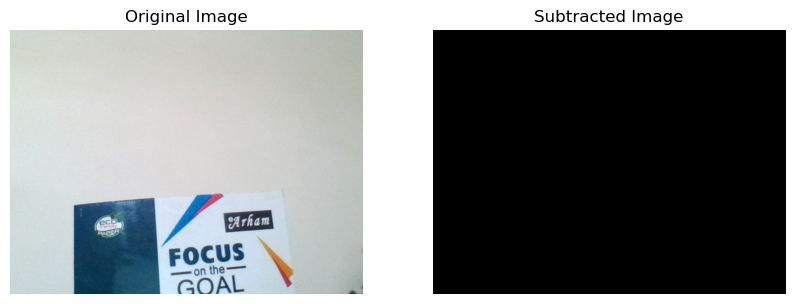

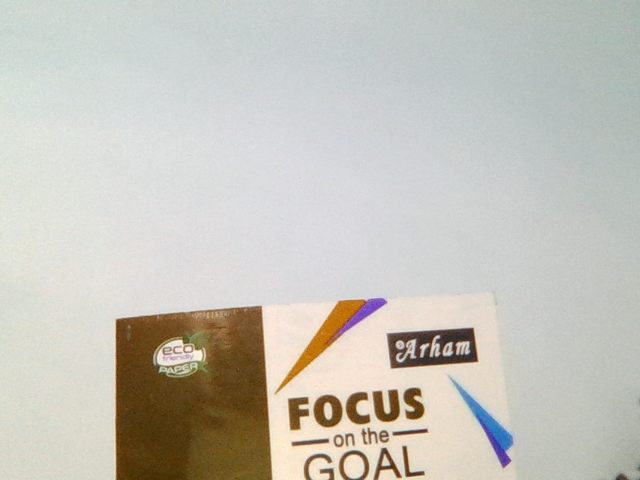

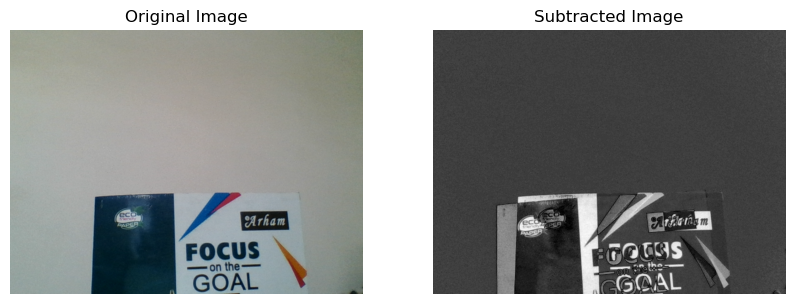

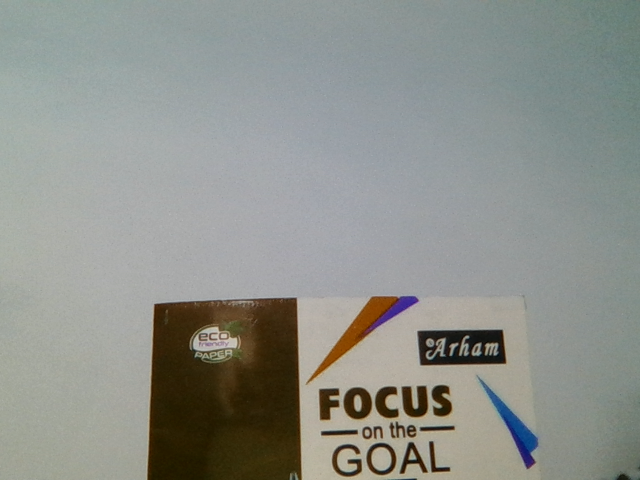

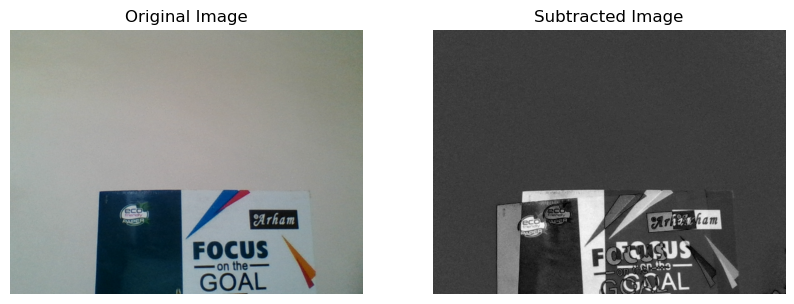

...

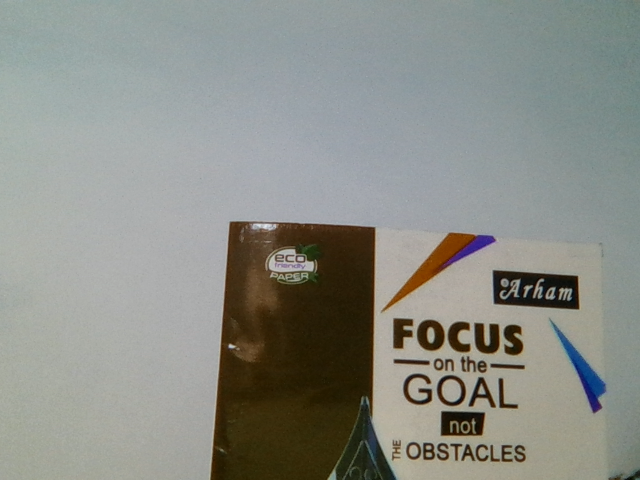

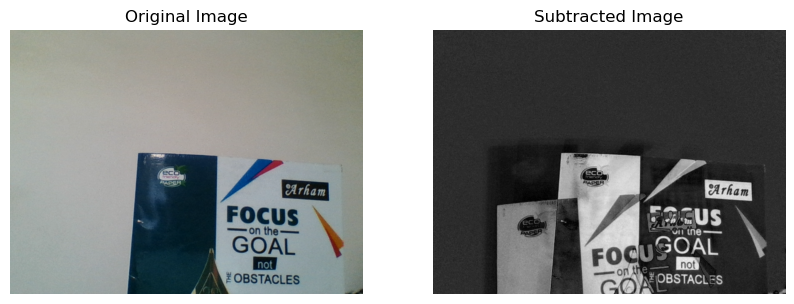

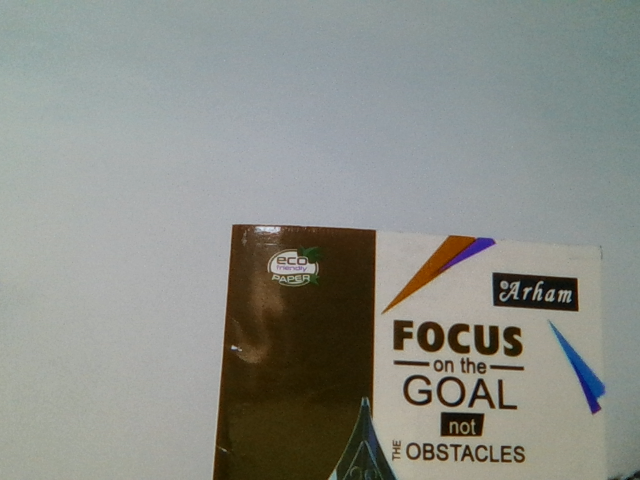

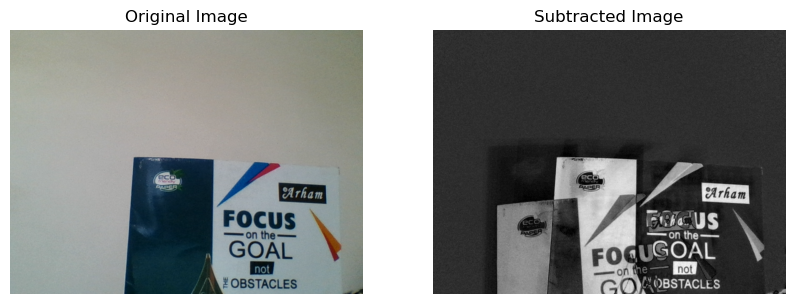

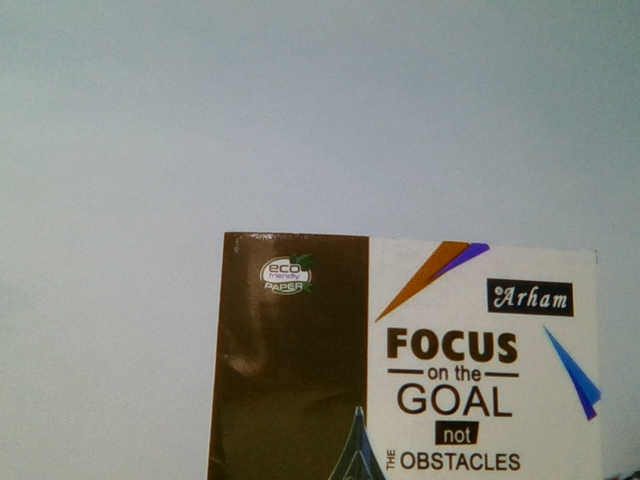

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display, Image

# Function to perform running average background subtraction
def running_average_bg_subtraction(image, alpha):
    if not hasattr(running_average_bg_subtraction, 'background'):
        running_average_bg_subtraction.background = image.copy().astype('float')

    cv2.accumulateWeighted(image, running_average_bg_subtraction.background, alpha)
    subtracted = cv2.absdiff(image, cv2.convertScaleAbs(running_average_bg_subtraction.background))
    
    return subtracted

# Capture video from webcam
cap = cv2.VideoCapture(0)

# Set the running average weight (alpha)
alpha = 0.02

try:
    while True:
        ret, frame = cap.read()
        if not ret:
            break

        # Convert the frame to grayscale
        gray_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

        # Apply running average background subtraction
        subtracted = running_average_bg_subtraction(gray_frame, alpha)

        # Display the original and subtracted images in the notebook
        _, ax = plt.subplots(1, 2, figsize=(10, 5))
        ax[0].imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
        ax[0].set_title('Original Image')
        ax[0].axis('off')

        ax[1].imshow(subtracted, cmap='gray')
        ax[1].set_title('Subtracted Image')
        ax[1].axis('off')

        plt.show()
        display(Image(data=cv2.imencode('.png', cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))[1].tobytes()))

except KeyboardInterrupt:
    # Release the webcam and close the notebook display on interruption
    cap.release()
    plt.close()

# Release the webcam
cap.release()
